<div style="background-color:#4a0000;">
   
<br>    
<p style="text-align:center">
    <a href="https://www.tamu.edu/" target="_blank">
    <img src="https://www.tamu.edu/assets/images/TAM-Logo-white.png" width="200" alt="TAM-Logo-white.png"  /> 
    </a>
</p>
<br> 
<p style="text-align:center">
<h1 style="color:White;line-height:.2"><center>FINAL PROJECT APPENDIX C </center> </h1>
<h3 style="color:White;line-height:.2"><center>EDA and Model Code </center> </h3>
<h3 style="color:White;line-height:.2"><center>Allison Moore </center> </h3>
<h3 style="color:White;line-height:.2"><center>620007444</center> </h3>
<h2 style="color:White;line-height:.8"><center>STAT 689, Section 700  Spring 2023</center> </h2>  
</p>
</div>


# Administrative Tasks & Pre-processsing 


In [1]:
#Import all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import matplotlib as mpl

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from scipy.stats.mstats import normaltest
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Ridge, Lasso
import itertools

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, roc_curve, auc, confusion_matrix,f1_score, jaccard_score 
from sklearn.model_selection import cross_val_score, learning_curve, ShuffleSplit
from sklearn.model_selection import LearningCurveDisplay
from sklearn.ensemble import RandomForestClassifier

import matplotlib.colors


plt.style.use('seaborn-darkgrid')
import warnings

warnings.filterwarnings("ignore")

In [2]:
#Read in data
df_s=pd.read_csv(r"Data/standard_method.csv")

In [3]:
print("Standard Method Missing Values:\n\n")
print(df_s.isna().sum())


Standard Method Missing Values:


slope_1     0
slope_2     0
slope_3     0
slope_4     0
slope_5     0
slope_6     0
slope_7     0
slope_8     0
slope_9     0
slope_10    0
slope_11    0
slope_12    0
slope_13    0
slope_14    0
slope_15    0
slope_16    0
slope_17    0
slope_18    0
slope_19    0
slope_20    0
slope_21    0
slope_22    0
slope_23    0
slope_24    0
slope_25    0
slope_26    0
slope_27    0
slope_28    0
slope_29    0
state       0
dtype: int64


In [ ]:
print(df_s.shape)

(253, 30)


# Exploratory Data Analysis

## Basic Stats and Associations

In [ ]:
#Basic Information about the data
df_s.describe()

,slope_1,slope_2,slope_3,slope_4,slope_5,slope_6,slope_7,slope_8,slope_9,slope_10,...,slope_21,slope_22,slope_23,slope_24,slope_25,slope_26,slope_27,slope_28,slope_29,state
count,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,...,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000
mean,-2.087851,-2.161572,-2.304361,-2.351204,-2.436890,-1.748563,-1.892103,-2.091540,-2.033880,-2.099781,...,-3.742025,-3.260183,-2.553790,-2.667007,-3.569928,-3.692603,-3.708572,-3.210014,-2.820926,0.640316
std,0.055913,0.094951,0.068240,0.067400,0.109361,0.078215,0.104484,0.056453,0.081253,0.097129,...,0.271508,0.371971,0.129066,0.283268,0.257194,0.254978,0.257751,0.190004,0.116318,0.480859
min,-2.241849,-2.341086,-2.452094,-2.528368,-2.816506,-2.190077,-2.170952,-2.257308,-2.377544,-2.332503,...,-4.413823,-4.156074,-2.883075,-3.488607,-4.154278,-4.517451,-4.401712,-3.869128,-3.097039,0.000000
25%,-2.125703,-2.243060,-2.353884,-2.396424,-2.513905,-1.795482,-1.971788,-2.127313,-2.081788,-2.166161,...,-3.916291,-3.546199,-2.635746,-2.868601,-3.756418,-3.875200,-3.902640,-3.305605,-2.897972,0.000000
50%,-2.088802,-2.169900,-2.304611,-2.352980,-2.438445,-1.745282,-1.897650,-2.089153,-2.039384,-2.100781,...,-3.718219,-3.235019,-2.571893,-2.695720,-3.595593,-3.646309,-3.714312,-3.224345,-2.825828,1.000000
75%,-2.053237,-2.087298,-2.257044,-2.312635,-2.359199,-1.698678,-1.818575,-2.053751,-1.984093,-2.046691,...,-3.539900,-2.983120,-2.490529,-2.462213,-3.443902,-3.512205,-3.554107,-3.107423,-2.756842,1.000000
max,-1.928286,-1.936351,-2.125038,-2.135961,-2.183381,-1.556525,-1.621142,-1.930772,-1.767277,-1.725603,...,-3.034158,-2.503598,-1.888790,-1.777315,-2.554308,-2.849453,-2.961984,-2.500539,-2.301936,1.000000


<Axes: title={'center': 'STANDARD METHOD: Pearson Correlation Matrix'}>

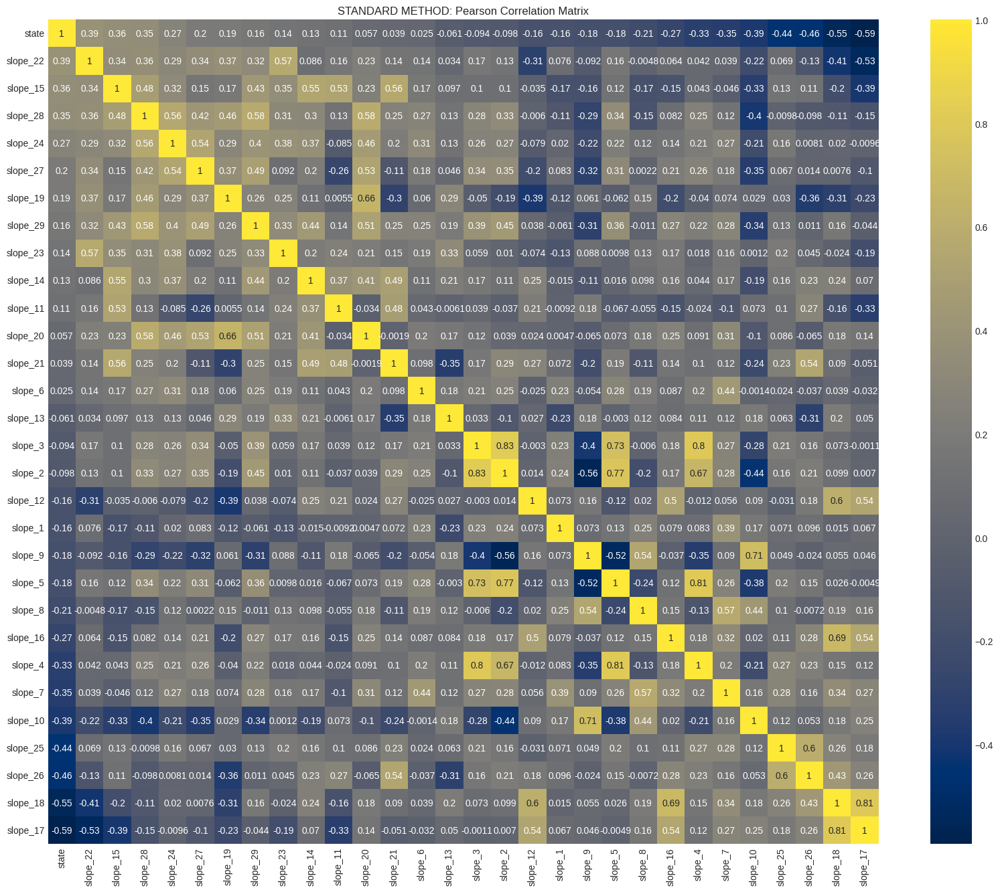

In [ ]:
#Quality correlation matrix
#Returns a corr matrix sorted by how strong the relationship is between the response and all other variables.
k = 30
cols = df_s.corr().nlargest(k, 'state')['state'].index
cm = df_s[cols].corr()
plt.figure(figsize=(20,16))
plt.title("STANDARD METHOD: Pearson Correlation Matrix")
sns.heatmap(cm, annot=True, cmap = 'cividis')


The strongest relationships with the response variable ('state') are negative and include Slopes 17, 18, 26, and 25.


## Distribution Analysis

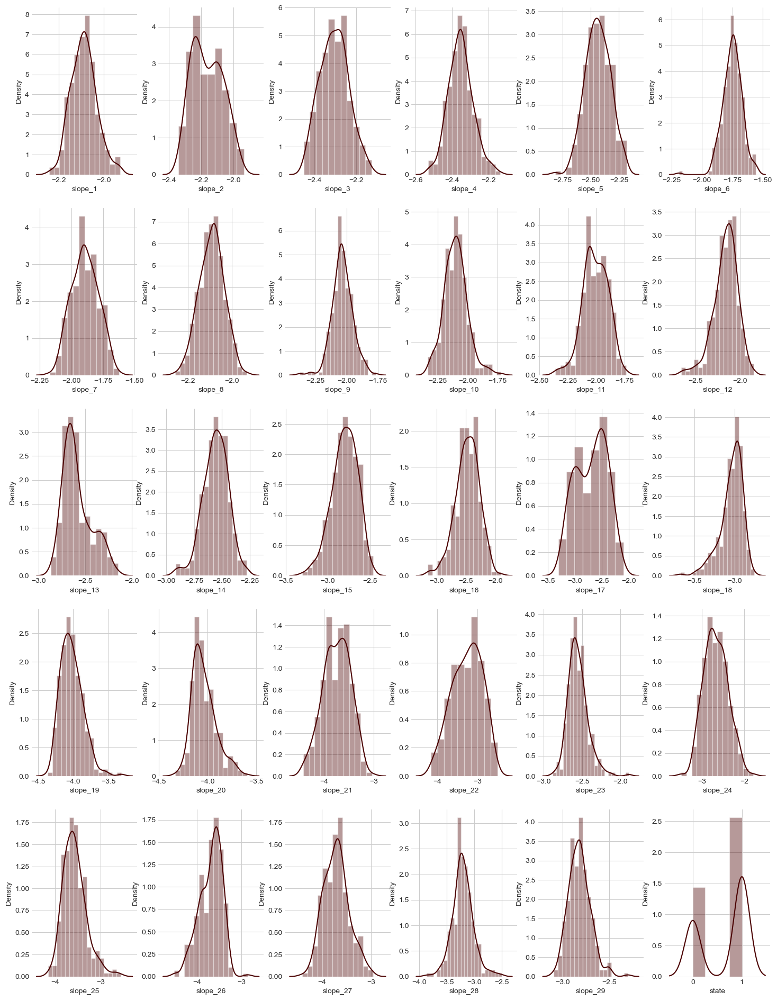

In [9]:
#Skewness

l = df_s.columns.values
number_of_columns=6
number_of_rows=50
plt.figure(figsize=(3*number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    try:
        sns.distplot(df_s[l[i]],kde=True, color='#4a0000') 
    except RuntimeError as re:
        if str(re).startswith("Selected KDE bandwidth is 0. Cannot estimate density."):
            sns.distplot(df_s[l[i]], kde_kws={'bw': 0.1}, color='#4a0000')
        else:
            raise re

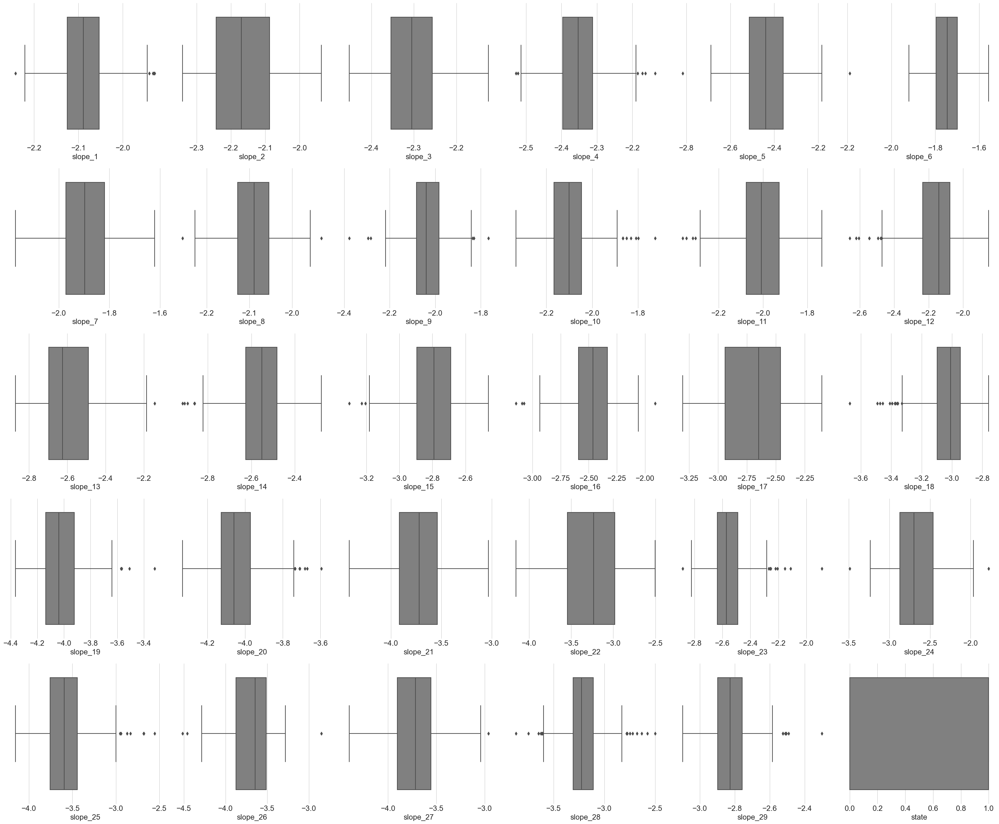

In [17]:
#Outliers

l = df_s.columns.values
number_of_columns=6
number_of_rows = 50
plt.figure(figsize=(5*number_of_columns,5*number_of_rows))
sns.set_style('whitegrid')
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    sns.boxplot(df_s[l[i]],color='gray',orient='h')
    plt.tight_layout()

Although there are numerous outliers, these are likely useful for determining the difference between a cancerous and a healthy spectra and will be maintained in the dataset.

### Additional Boxplots

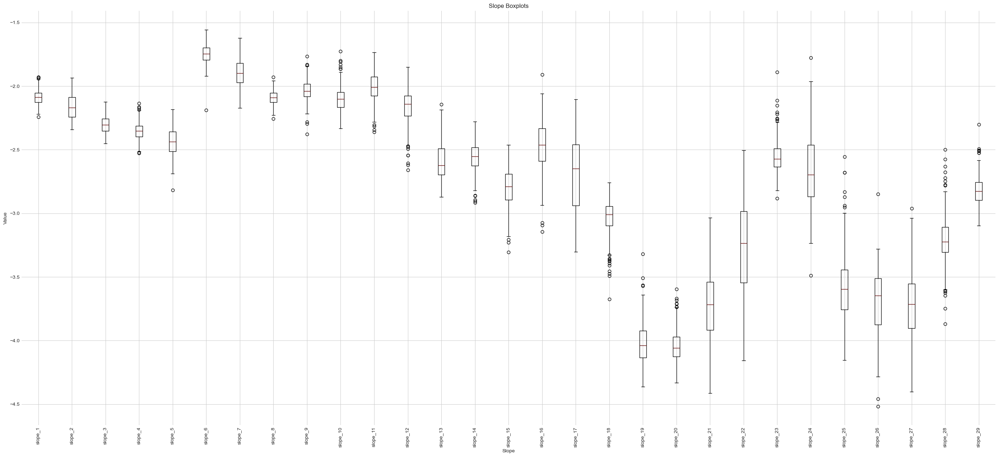

In [11]:
#Considering all slope boxplots against each other
df_s2=df_s.drop(columns=['state'], axis=1)
fig, ax = plt.subplots(figsize=(35, 15))
medianprops = dict({'color':'#5a0000'})
ax.boxplot(df_s2,  medianprops=medianprops, widths=.2)

# Add labels

ax.set_xlabel('Slope')
ax.set_xticklabels(df_s2.columns.tolist(), rotation=90)
ax.set_ylabel('Value')

ax.set_title('Slope Boxplots')

plt.show()


There is large variation within slopes, approximately Slope15-28.

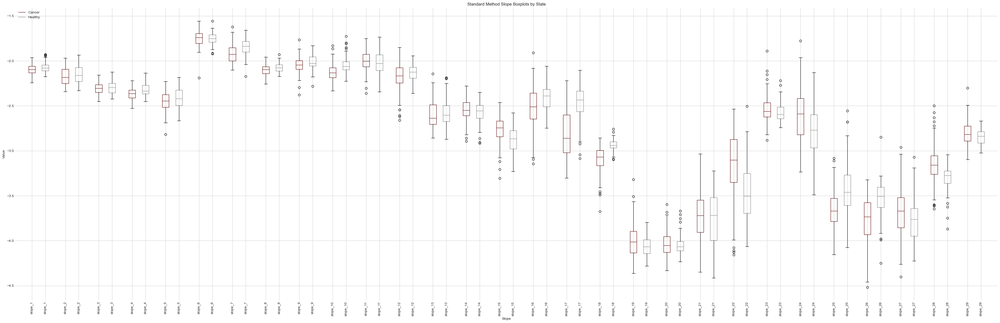

In [13]:
#Considering Standard Method, grouping by state
df_s_c=df_s.query("state==1")
df_s_h=df_s.query("state==0")
df_s_c=df_s_c.drop(columns=['state'],axis=1)
df_s_h=df_s_h.drop(columns=['state'],axis=1)
fig, ax = plt.subplots(figsize=(50, 15))
positions1 = np.arange(1, len(df_s_c.columns)+1)-.2
positions2 = np.arange(1, len(df_s_h.columns)+1)+.2
boxpropc=dict({'color':'#5a0000'})
boxproph=dict({'color':'gray'})
medianprops = dict({'color':'#5a0000'})
medianpropd = dict({'color':'gray'})
ax.boxplot(df_s_c, positions=positions1, medianprops=medianprops,boxprops=boxpropc, widths=.2)
ax.boxplot(df_s_h, positions=positions2,medianprops=medianpropd, boxprops=boxproph, widths=.2)

# Add labels

ax.set_xlabel('Slope')
ax.set_xticklabels(df_s_c.columns.tolist() + df_s_h.columns.tolist(), rotation=90)
ax.set_ylabel('Value')
leg=ax.legend(labels=['Cancer','Healthy'], loc='upper left')
leg.legendHandles[0].set_color('#5a0000')
leg.legendHandles[1].set_color('gray')
ax.set_title('Standard Method Slope Boxplots by State')

plt.show()

Some slopes are noteworthy due to larger IQR and/or significant median shifts between healthy and cancerous:

*   Slopes 16, 17 and 26 have substantially wider IQRs for cancerous than healthy spectra. Interestingly, only Slope 16's cancerous spectra contain outliers, while only Slope 17's healthy spectra contain outliers.
*   Slopes 17 and 22 exhibit substantial median shifts between cancerous and healthy spectra.
*   Slope 18's cancerous medians are roughly equal to the lower end of the healthy IQRs.




# Data Visualization

## Pairplots

In [ ]:
#Approximately 20+ minute run time.
#Standard Method Pair plot
sns.pairplot(df_s, hue='state', palette='cividis')
plt.show()


Output hidden; open in https://colab.research.google.com to view.

## Additional Plots

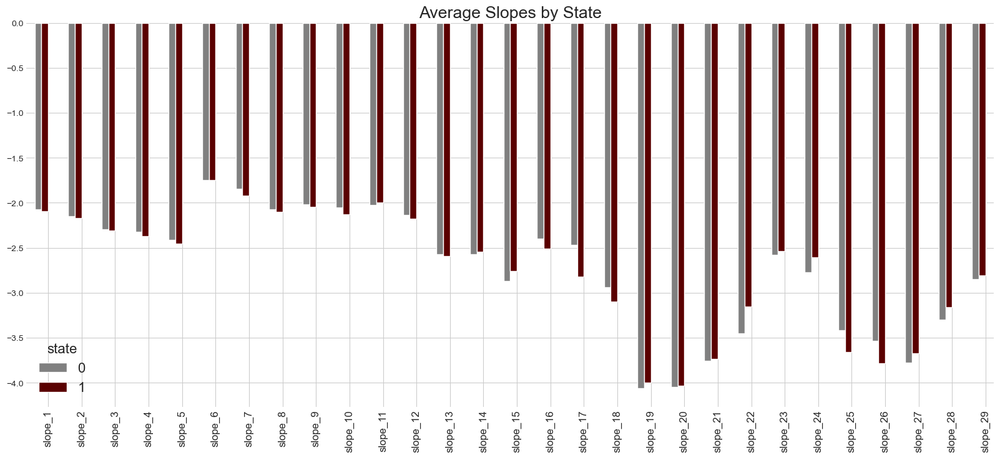

In [14]:
#Average values per slope
#Grouping by state
df_means = df_s.groupby('state').mean()
df_mts=df_means.transpose()
fig, ax = plt.subplots(figsize=(20, 8))
mpl.rcParams['font.size'] = 16
df_mts.plot.bar(ax=ax, color=['gray', '#5a0000'], width=.4, position=1)
ax.set_title('Average Slopes by State')
ax.set_xticklabels(df_mts.index,fontsize=12)
plt.show()

Cancerous average slope values tend to be more negative, with Slopes 17, 25, and 26 offering large disparities between healthy and cancerous.

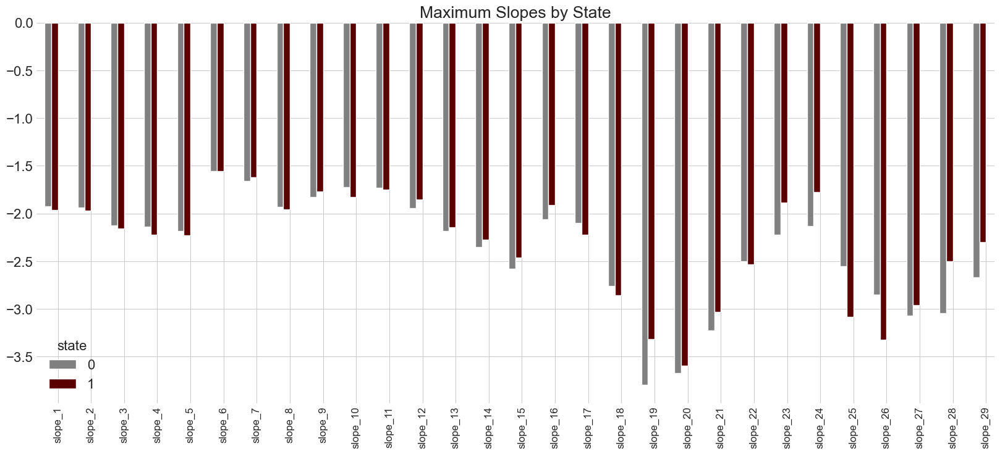

In [15]:
#Maximum values per slope
#Grouping by state
df_maxs = df_s.groupby('state').max()
df_mxts=df_maxs.transpose()
fig, ax = plt.subplots(figsize=(20, 8))
mpl.rcParams['font.size'] = 16
df_mxts.plot.bar(ax=ax, color=['gray', '#5a0000'], width=.4, position=1)
ax.set_title('Maximum Slopes by State')
ax.set_xticklabels(df_mxts.index,fontsize=12)
plt.show()

Maximum slope values show most negative at Slope 19 with a healthy patient. We see the most disparity between healthy and cancerous on Slopes 19, 23-29 (where healthy are more negative than cancerous) and on Slopes 25-26 (where cancerous are more negative than healthy).

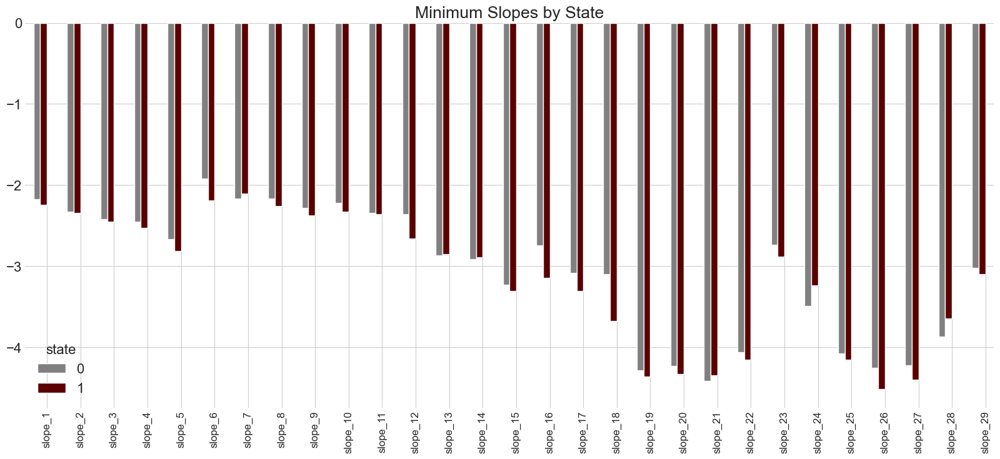

In [16]:
#Minimum values per slope
#Grouping by state
df_mins = df_s.groupby('state').min()
df_mnts=df_mins.transpose()
fig, ax = plt.subplots(figsize=(20, 8))
mpl.rcParams['font.size'] = 16
df_mnts.plot.bar(ax=ax, color=['gray', '#5a0000'], width=.4, position=1)
ax.set_title('Minimum Slopes by State')
ax.set_xticklabels(df_mnts.index,fontsize=12)
plt.show()

Here, cancerous slopes are consistently more negative than healthy with Slope 18 offering the largest disparity.

<h1>As a result of this EDA, I expect to see Slopes 17, 18, and 23-26 contribute the most to the identification of cancerous mass spectra. </h1>

# Functions

##Support Functions

In [ ]:
#Define a function to plot the Learning Curve
def LearnCurve(x,y,params,model,ax):

  """ Function to plot the learning curve for ML models
  x= independent variables
  y=response/ dependent variable(s)
  params= best parameters identified in cv grid search
  model= the model for which the user wants to plot a learning curve
  ax= Axes plot location information
  """


  train_sizes = np.linspace(0.1, 1.0, 5)
  if model=='svc':
    mod=svm.SVC(**params)
  elif model=='logr':
    mod=LogisticRegression()
  elif model=='rf':
    mod=RandomForestClassifier()
  elif model=='knn':
    mod=KNeighborsClassifier()
  elif model=='ctree':
    mod=DecisionTreeClassifier()
  else:
    print("No Model Detected")

# Define the shuffle split cross-validator
  cv = ShuffleSplit(n_splits=10, random_state=0)
  train_sizes, train_scores, test_scores = learning_curve(
      mod, x, y, cv=cv, n_jobs=-1,scoring = 'accuracy',
      train_sizes=train_sizes)


# Compute the learning curve scores
  train_mean = np.mean(train_scores, axis=1)
  train_std = np.std(train_scores, axis=1)

  test_mean = np.mean(test_scores, axis=1)
  test_std = np.std(test_scores, axis=1)

#Plot Curves
  ax.plot(train_sizes, train_mean, '--', color="Black",  label="Training score")
  ax.plot(train_sizes, test_mean, color="#400000", label="Cross-validation score")
  
  ax.set_xlabel("Training Set Size", fontsize=22), ax.set_ylabel("Accuracy", fontsize=22), ax.legend(loc="best", fontsize=22)
  plt.tight_layout()
  

In [ ]:
#Define a function to plot variable importance for linear type kernels
def imp(x, clf,ax):
    """ Function to plot feature importance for applicable models
    x= independent variables
    clf= best performing model
    ax= Axes plot location information
    """
    coef = clf.coef_.flatten()
    feature_names = x.columns.values
    importance = np.abs(coef)
    sorted_importance = importance.argsort()[::-1]
    sorted_features = feature_names[sorted_importance][:10]
    sorted_importance_values = importance[sorted_importance][:10]


    ax.bar(range(len(sorted_features)), sorted_importance_values, width=.3, edgecolor='black',color="#400000")
    ax.set_xticks(range(len(sorted_features)), sorted_features, rotation=90, fontsize=20)
    ax.set_ylabel('Feature Importance', fontsize=22)

   

In [ ]:
#Define a function to plot Accuracy vs. Test size
def AccPlot(x_val,y_val,ax):
  """ Function to plot model accuracy vs. test size
  x_val= integers 1-10
  y_val= Accuracy for each test size
  ax= Axes plot location information
  """
  ax.plot(x_val, y_val, color="#400000")
  ax.set_ylabel("Estimated Test Accuracy", fontsize=22)
  ax.set_xlabel("Test Size (x/10)%", fontsize=22)
  ax.set_xticks(np.arange(min(x_val), max(x_val)+1, 1),x_val, fontsize=20)


In [ ]:
#Define a function to plot the ROC curve
def ROC_Plot(y1,y2,ax):
  """
  Function to plot the ROC 
  y1=Actual y values
  y2=Predicted y values
  ax= Axes plot location information
  """
  threshold = np.linspace(0,1,50)
  fpr, tpr, thresholds = roc_curve(y1, y2)
  roc_auc = auc(fpr, tpr)

  ax.plot(fpr, tpr, color="#400000", lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
  ax.plot([0, 1], [0, 1],  lw=2, linestyle='--', color='black')
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.legend(loc="lower right")


##Model Functions

### Logistic Regression

In [ ]:
#Define a function for basic logistic regression
def models_logreg(x,y,type='b'):  
  """Function to conduct cv hypergrid of logistic regression model
  x=independent variables
  y=dependent variable(s)
  type: 'b'=basic LR, 's'=scaled x, 'n'=normalized x
      default to basic
  """ 
  y_val = []
  x_val = []
  best_i=1
  b_p=[]
  best_y=0
  if type=='s':
    s=StandardScaler()
    x=s.fit_transform(x)
  if type=='n':
    x=preprocessing.normalize(x)
  for i in range(1,10): 
    X_train, X_test, y_train, y_test = train_test_split(x,y, random_state=42,test_size=i/10, shuffle=True)
    
# Set up the parameter grid
    log_Reg = LogisticRegression()
    parameters = dict(C=np.logspace(-4, 4, 50),
                      penalty= ['l1', 'l2', 'elasticnet'],
                      solver=['lbfgs', 'liblinear', 'newton-cg',  'sag'])

# Create a GridSearchCV object
    grid_search = GridSearchCV(log_Reg, parameters, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the GridSearchCV object to the training data
    grid_search.fit(X_train, y_train)

# Get the best hyperparameters and score
    best_params = grid_search.best_params_
    b_p.append(best_params)
    best_score = grid_search.best_score_
    logr_best = LogisticRegression(**best_params)
    logr_best.fit(X_train, y_train)
    y_pred= logr_best.predict(X_test)
    x_val.append(i)
    y_val.append(accuracy_score(y_test,y_pred)*100)
    if i!=1:
      if y_val[i-1]> best_y:
        best_y=y_val[i-1]
        best_i=i
        y_pred_bestp=logr_best.predict_proba(X_test)[:, 1]
        y_pred_best=logr_best.predict(X_test)
        y_act=y_test    
        
  fig, ax= plt.subplots(2,2,figsize=(40,15))
  mpl.rcParams['font.size'] = 28
  ax[0,0].set_title('Learning Curve')
  LearnCurve(X_train, y_train, b_p[best_i-1],'logr',ax[0,0])
  ax[0,1].set_title('Test Accuracy vs. Train-Test Split')
  AccPlot(x_val,y_val,ax[0,1])

  if type=='b':
    ax[1,0].set_title('Features Importance')
    imp(x,logr_best,ax[1,0])
    ax[1,1].set_title("ROC Curve")
    ROC_Plot(y_act,y_pred_bestp,ax[1,1])
  else:
    ax[1,0].set_title("ROC Curve")
    ROC_Plot(y_act,y_pred_bestp,ax[1,0])
    ax[1, 1].axis('off')

  plt.show()
#Output Accuracy metrics
  Ac=max(y_val)
  F1=f1_score(y_act, y_pred_best, average='weighted')
  Jac=jaccard_score(y_act, y_pred_best, average='micro')
  print("\n\nMax Accuracy:",Ac)
  print("F1: ",F1 )
  print("Jaccard:",Jac )
  print("\n\nParams: ",b_p[best_i-1])
  return(Ac,F1,Jac)

### Support Vector Classification

In [ ]:
# Create a function that conducts Support Vector Classification 
def models_svc(x,y):   
  """ Function to conduct cv hypergrid of support vector classification model
  x=independent variables
  y=dependent variable(s)
  """
  y_val = []
  x_val = []
  best_i=1
  b_p=[]
  b_pk=[]

  best_y=0
  for i in range(1,10): 
    X_train, X_test, y_train, y_test = train_test_split(x,y, random_state=42,test_size=i/10, shuffle=True)


    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_test)

# Set up the parameter grid
    param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['linear', 'rbf'],
    }
    svr = svm.SVC(probability=True)

# Create a GridSearchCV object
    grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the GridSearchCV object to the training data
    grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters and score
    best_params = grid_search.best_params_
    b_p.append(best_params)
    best_score = grid_search.best_score_
    svr_best = svm.SVC(**best_params, probability=True)
    svr_best.fit(X_train_scaled, y_train)
    y_pred= svr_best.predict(X_test)

    x_val.append(i)
    y_val.append(accuracy_score(y_test,y_pred)*100)
    if i>1:
      if y_val[i-1]> best_y:
        best_y=y_val[i-1]
        best_i=i
        b_pk=best_params['kernel']
        y_pred_bestp=svr_best.predict_proba(X_test)[:, 1]
        y_pred_best=svr_best.predict(X_test)
        y_act=y_test
    k=str(b_pk)
  
  fig, ax= plt.subplots(2,2,figsize=(40,15))
  mpl.rcParams['font.size'] = 28
  
  if k=='linear':
    ax[0,0].set_title('Learning Curve')
    LearnCurve(X_train, y_train, b_p[best_i-1], 'svc',ax[0,0])
    ax[0,1].set_title('Test Accuracy vs. Train-Test Split')
    AccPlot(x_val,y_val,ax[0,1])
    ax[1,0].set_title('Features Importance')
    imp(x,svr_best,ax[1,0])
    ax[1,1].set_title("ROC Curve")
    ROC_Plot(y_act,y_pred_bestp,ax[1,1])
  else:
    ax[0,0].set_title('Learning Curve')
    LearnCurve(X_train, y_train, b_p[best_i-1],'svc',ax[0,0])
    ax[0,1].set_title('Test Accuracy vs. Train-Test Split')
    AccPlot(x_val,y_val,ax[0,1])
    ax[1,0].set_title('ROC Curve')
    ROC_Plot(y_act,y_pred_bestp,ax[1,0])
    ax[1, 1].axis('off')

  plt.show()
  Ac=max(y_val)
  F1=f1_score(y_act, y_pred_best, average='weighted')
  Jac=jaccard_score(y_act, y_pred_best, average='micro')
  print("\n\nMax Accuracy:",Ac)
  print("F1: ",F1 )
  print("Jaccard:",Jac )
  print("\n\nParams: ",b_p[best_i-1])
  return(Ac,F1,Jac)

### Random Forest

In [ ]:
#Define a function that conducts Random Forest classification and/or features selection
def models_rf(x,y,imft=10,rt_imp=False):
  """Function to conduct cv hypergrid of Random Forest model, can also conduct feature selection for other models.
  x=independent variables
  y=dependent variable(s)
  imft=Number of important features to report, default 10
  rt_imp=Report important features? For feature selection 
      prior to other using other ML methods
  """
  y_val = []
  x_val = []
  best_i=1
  b_p=[]
  best_y=0
  #x=preprocessing.normalize(x)
  for i in range(1,10): 
    X_train, X_test, y_train, y_test = train_test_split(x,y, random_state=42,test_size=i/10, shuffle=True)
    
# Set up the parameter grid
    rf= RandomForestClassifier()
    parameters = dict(criterion=['gini', 'entropy'] ,
                      max_depth=range(2,20),
                      n_estimators = range(1,30))

# Create a GridSearchCV object
    grid_search = GridSearchCV(rf, parameters, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the GridSearchCV object to the training data
    grid_search.fit(X_train, y_train)

# Get the best hyperparameters and score
    best_params = grid_search.best_params_
    b_p.append(best_params)
    best_score = grid_search.best_score_
    rf_best = RandomForestClassifier(**best_params)
    rf_best.fit(X_train, y_train)
    y_pred= rf_best.predict(X_test)
    x_val.append(i)
    y_val.append(accuracy_score(y_test,y_pred)*100)
    if i>1:
      if y_val[i-1]> best_y:
        best_y=y_val[i-1]
        best_i=i
        y_pred_bestp=rf_best.predict_proba(X_test)[:, 1]
        y_pred_best=rf_best.predict(X_test)
        y_act=y_test
        rf_imp=rf_best.feature_importances_
        sorted_idx = rf_imp.argsort()[::-1][:imft]
  if rt_imp==False:
    fig, ax= plt.subplots(2,2,figsize=(40,15))
    mpl.rcParams['font.size'] = 28
    ax[0,0].set_title('Learning Curve')
    LearnCurve(X_train, y_train, b_p[best_i-1],'rf',ax[0,0])
    ax[0,1].set_title('Test Accuracy vs. Train-Test Split')
    AccPlot(x_val,y_val,ax[0,1])
    ax[1,0].set_title('Features Importance')
    ax[1,0].bar(x.columns[sorted_idx], rf_imp[sorted_idx], color="#400000")
    ax[1,0].set_xticks(range(len(x.columns[sorted_idx])), x.columns[sorted_idx], rotation=90, fontsize=20)
    ax[1,0].set_ylabel('Feature Importance', fontsize=22)
    ax[1,1].set_title("ROC Curve")
    ROC_Plot(y_act,y_pred_bestp,ax[1,1])
    plt.show()

#Output Accuracy metrics
  Ac=max(y_val)
  F1=f1_score(y_act, y_pred_best, average='weighted')
  Jac=jaccard_score(y_act, y_pred_best, average='micro')
  print("\n\nMax Accuracy:",Ac)
  print("F1: ",F1 )
  print("Jaccard:",Jac )
  print("\n\nParams: ",b_p[best_i-1])
  if rt_imp==False:
    return(Ac,F1,Jac)
  if rt_imp==True:
    return(x.columns[sorted_idx], rf_imp[sorted_idx])

### K Nearest Neighbors

In [ ]:
#Define a function that conducts KNN
def models_knn(x,y):
  """ Function to conduct cv hypergrid of KNN model
  x=independent variables
  y=dependent variable(s)
  """
  y_val = []
  x_val = []
  best_i=1
  b_p=[]
  best_y=0
  s=StandardScaler()
  x=s.fit_transform(x)
  for i in range(1,10): 
    X_train, X_test, y_train, y_test = train_test_split(x,y, random_state=42,test_size=i/10, shuffle=True)
    
# Set up the parameter grid
    knn=KNeighborsClassifier()
    parameters = dict(n_neighbors=list(range(1, 31)),
                      weights=['uniform', 'distance'],
                      algorithm=['auto','ball_tree','kd_tree','brute'])

# Create a GridSearchCV object
    grid_search = GridSearchCV(knn, parameters, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the GridSearchCV object to the training data
    grid_search.fit(X_train, y_train)

# Get the best hyperparameters and score
    best_params = grid_search.best_params_
    b_p.append(best_params)
    best_score = grid_search.best_score_
    knn_best = KNeighborsClassifier(**best_params)
    knn_best.fit(X_train, y_train)
    y_pred= knn_best.predict(X_test)
    x_val.append(i)
    y_val.append(accuracy_score(y_test,y_pred)*100)
    if i!=1:
      if y_val[i-1]> best_y:
        best_y=y_val[i-1]
        best_i=i
        y_pred_bestp=knn_best.predict_proba(X_test)[:, 1]
        y_pred_best=knn_best.predict(X_test)
        y_act=y_test

  fig, ax= plt.subplots(2,2,figsize=(40,15))
  mpl.rcParams['font.size'] = 28
  ax[0,0].set_title('Learning Curve')
  LearnCurve(X_train, y_train, b_p[best_i-1],'knn',ax[0,0])
  ax[0,1].set_title('Test Accuracy vs. Train-Test Split')
  AccPlot(x_val,y_val,ax[0,1])
  ax[1,0].set_title("ROC Curve")
  ROC_Plot(y_act,y_pred_bestp,ax[1,0])
  ax[1, 1].axis('off')

  plt.show()
#Output Accuracy metrics
  Ac=max(y_val)
  F1=f1_score(y_act, y_pred_best, average='weighted')
  Jac=jaccard_score(y_act, y_pred_best, average='micro')
  print("\n\nMax Accuracy:",Ac)
  print("F1: ",F1 )
  print("Jaccard:",Jac )
  print("\n\nParams: ",b_p[best_i-1])
  return(Ac,F1,Jac)


  

### Classification Tree and Pruning

In [ ]:
#Define a function that conducts a classification tree and pruning
def models_ctreep(x,y,imft=10):
  """ Function to conduct cv hypergrid of Classification tree & prune model
  x=independent variables
  y=dependent variable(s)
  imft=Number of important features to report, default 10
      used for features importance plot
  """
  y_val = []
  x_val = []
  best_i=1
  b_p=[]
  best_y=0
  le = LabelEncoder()
  y = le.fit_transform(y)
  for i in range(1,10): 
    X_train, X_test, y_train, y_test = train_test_split(x,y, random_state=42,test_size=i/10, shuffle=True)
    
# Set up the parameter grid
    ctree = DecisionTreeClassifier()
    parameters = dict(criterion=['gini','entropy'],
                      max_depth=range(1,20),
                      min_samples_split=range(2,10))

# Create a GridSearchCV object
    grid_search = GridSearchCV(ctree, parameters, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the GridSearchCV object to the training data
    grid_search.fit(X_train, y_train)

# Get the best hyperparameters and score
    best_params = grid_search.best_params_
    b_p.append(best_params)
    best_score = grid_search.best_score_
    ctree_best = DecisionTreeClassifier(**best_params)
    ctree_best.fit(X_train, y_train)
    y_pred= ctree_best.predict(X_test)
    x_val.append(i)
    y_val.append(accuracy_score(y_test,y_pred)*100)
    if i!=1:
      if y_val[i-1]> best_y:
        best_y=y_val[i-1]
        best_i=i
        y_pred_bestp=ctree_best.predict_proba(X_test)[:, 1]
        y_pred_best=ctree_best.predict(X_test)
        y_act=y_test
        ctree_imp=ctree_best.feature_importances_
        sorted_idx = ctree_imp.argsort()[::-1][:imft]
  
  fig, ax= plt.subplots(2,2,figsize=(40,15))
  mpl.rcParams['font.size'] = 28
  ax[0,0].set_title('Learning Curve')
  LearnCurve(X_train, y_train, b_p[best_i-1],'ctree',ax[0,0])
  ax[0,1].set_title('Test Accuracy vs. Train-Test Split')
  AccPlot(x_val,y_val,ax[0,1])
  ax[1,0].set_title('Features Importance')
  ax[1,0].bar(x.columns[sorted_idx], ctree_imp[sorted_idx], color="#400000")
  ax[1,0].set_xticks(range(len(x.columns[sorted_idx])), x.columns[sorted_idx], rotation=90, fontsize=20)
  ax[1,0].set_ylabel('Feature Importance', fontsize=22)
  ax[1,1].set_title("ROC Curve")
  ROC_Plot(y_act,y_pred_bestp,ax[1,1])

  plt.show()
#Output Accuracy metrics
  Ac=max(y_val)
  F1=f1_score(y_act, y_pred_best, average='weighted')
  Jac=jaccard_score(y_act, y_pred_best, average='micro')
  print("\n\nMax Accuracy:",Ac)
  print("F1: ",F1 )
  print("Jaccard:",Jac )
  print("\n\nParams: ",b_p[best_i-1])
  return(Ac,F1,Jac)



# Models

In [ ]:
#Define X and y for Standard Method
Xs=df_s.drop(['state'], axis=1)
ys=df_s['state']

## Support Vector Classification

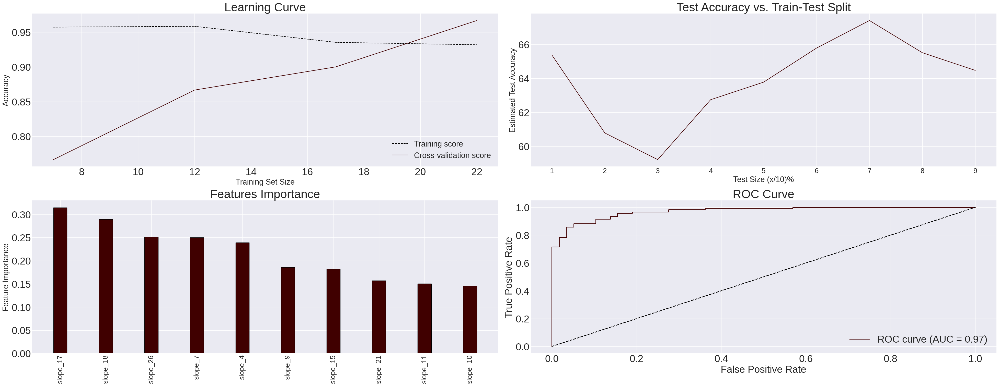



Max Accuracy: 67.41573033707866
F1:  0.5429454792247945
Jaccard: 0.5084745762711864


Params:  {'C': 1, 'gamma': 1, 'kernel': 'linear'}


In [ ]:
#<1 minute run time. 
Ac_svc,F1_svc,Jac_svc=models_svc(Xs,ys)

## Logistic Regression

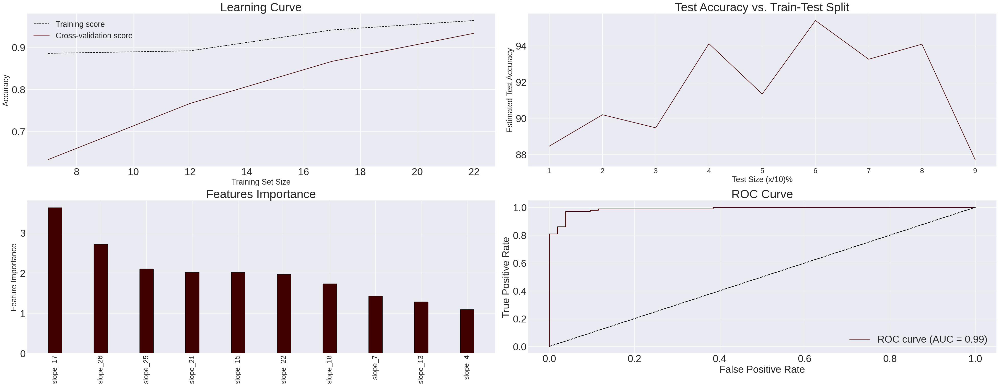



Max Accuracy: 95.39473684210526
F1:  0.9538383707420993
Jaccard: 0.9119496855345912


Params:  {'C': 5.428675439323859, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 5 minute run time.
Ac_lr,F1_lr,Jac_lr=models_logreg(Xs,ys)

## Logistic Regression Scaled

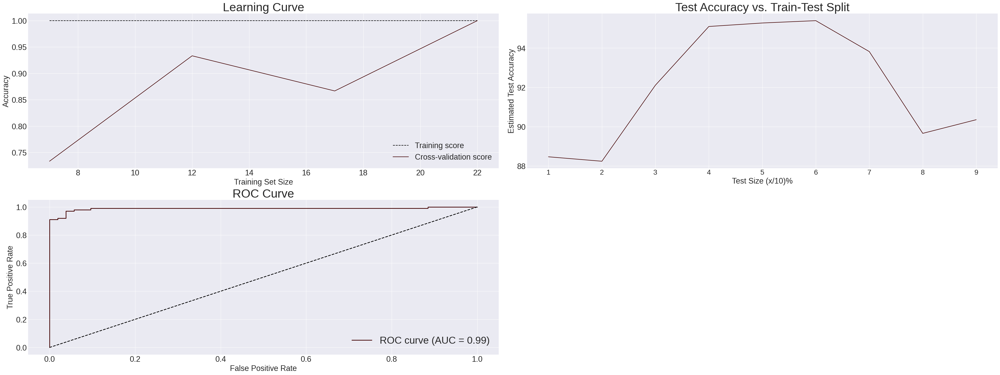



Max Accuracy: 95.39473684210526
F1:  0.9542423115048403
Jaccard: 0.9119496855345912


Params:  {'C': 0.05963623316594643, 'penalty': 'l2', 'solver': 'liblinear'}


In [ ]:
#Approximately 1+ minute run time.
Ac_lr_sc,F1_lr_sc,Jac_lr_sc=models_logreg(Xs,ys,'s')

## Logistic Regression Normalized

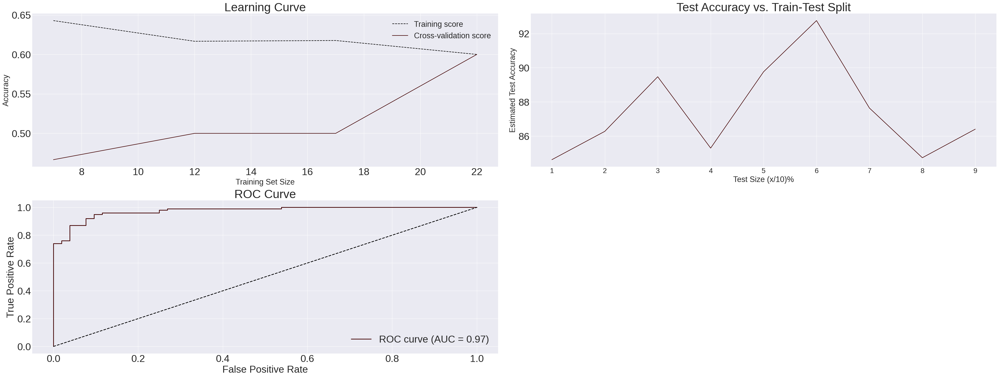



Max Accuracy: 92.76315789473685
F1:  0.9277943602725407
Jaccard: 0.8650306748466258


Params:  {'C': 494.1713361323828, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 2 minute run time
Ac_lr_n,F1_lr_n,Jac_lr_n=models_logreg(Xs,ys, 'n')

## Random Forest

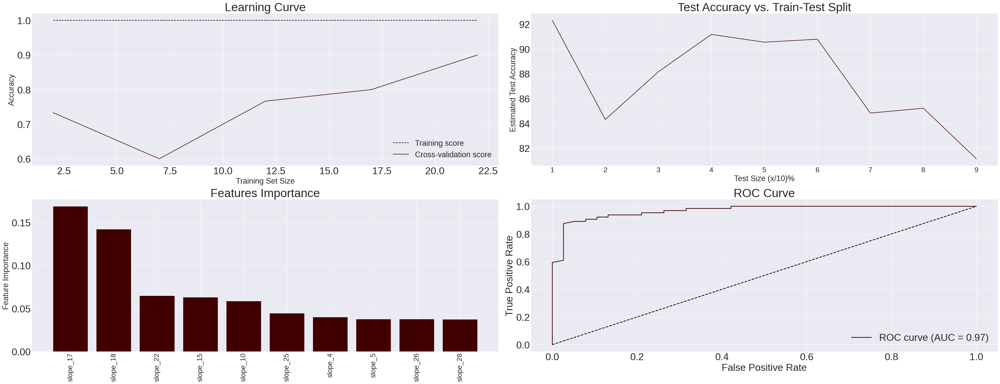



Max Accuracy: 92.3076923076923
F1:  0.9115184678522571
Jaccard: 0.8378378378378378


Params:  {'criterion': 'entropy', 'max_depth': 6, 'n_estimators': 28}


In [ ]:
#Approximately 23 minute run time.
Ac_rf,F1_rf,Jac_rf=models_rf(Xs,ys)

## K Nearest Neighbors

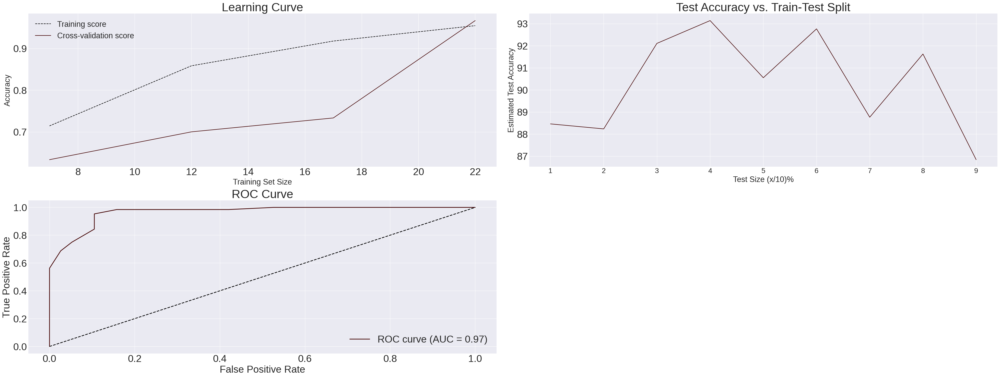



Max Accuracy: 93.13725490196079
F1:  0.9311810305517557
Jaccard: 0.8715596330275229


Params:  {'algorithm': 'auto', 'n_neighbors': 20, 'weights': 'uniform'}


In [ ]:
#<1 minute run time.
Ac_knn,F1_knn,Jac_knn=models_knn(Xs,ys)

## Classification Tree and Pruning

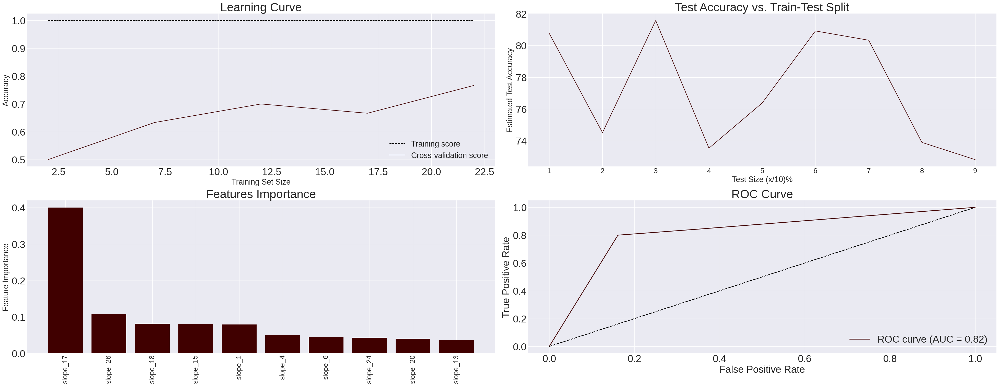



Max Accuracy: 81.57894736842105
F1:  0.8170876451170209
Jaccard: 0.6888888888888889


Params:  {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 5}


In [ ]:
#Approximately 1 minute run time.
Ac_ctree,F1_ctree,Jac_ctree=models_ctreep(Xs,ys)

# Additional Models- Feature Reduction

## Reduced by Random Forest

In [ ]:
#Can use this line of code to prevent re-running RF for feature selection below.
imp_names=['slope_18', 'slope_17', 'slope_22', 'slope_4', 'slope_10', 'slope_25',
       'slope_26', 'slope_5', 'slope_15', 'slope_23', 'slope_28', 'slope_9',
       'slope_21', 'slope_3', 'slope_14']

In [ ]:
#RF Feature Selection prior to SVC
#Approximately 13 minute run time.
imp_names, imp_values=models_rf(Xs,ys,imft=15,rt_imp=True)



Max Accuracy: 89.76377952755905
F1:  0.8978702346638648
Jaccard: 0.8142857142857143


Params:  {'criterion': 'entropy', 'max_depth': 14, 'n_estimators': 28}


In [ ]:
Xs_narrow=Xs[imp_names]
print(imp_names)

Index(['slope_18', 'slope_17', 'slope_22', 'slope_4', 'slope_10', 'slope_25',
       'slope_26', 'slope_5', 'slope_15', 'slope_23', 'slope_28', 'slope_9',
       'slope_21', 'slope_3', 'slope_14'],
      dtype='object')


### Support Vector Classification

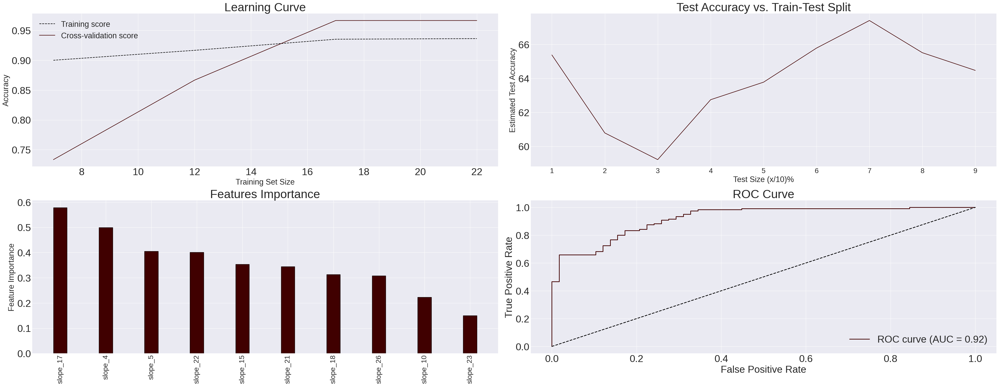



Max Accuracy: 67.41573033707866
F1:  0.5429454792247945
Jaccard: 0.5084745762711864


Params:  {'C': 1, 'gamma': 1, 'kernel': 'linear'}


In [ ]:
#<1 minute run time.
Ac_svc_nr,F1_svc_nr,Jac_svc_nr=models_svc(Xs_narrow,ys)

### Logistic Regression x3

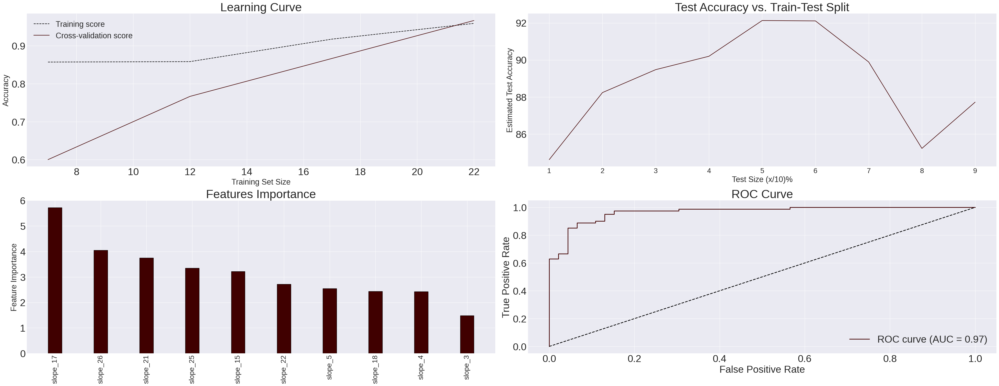



Max Accuracy: 92.1259842519685
F1:  0.92041897008219
Jaccard: 0.8540145985401459


Params:  {'C': 5.428675439323859, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 3 minute run time.
Ac_lr_nr,F1_lr_nr,Jac_lr_nr=models_logreg(Xs_narrow,ys)

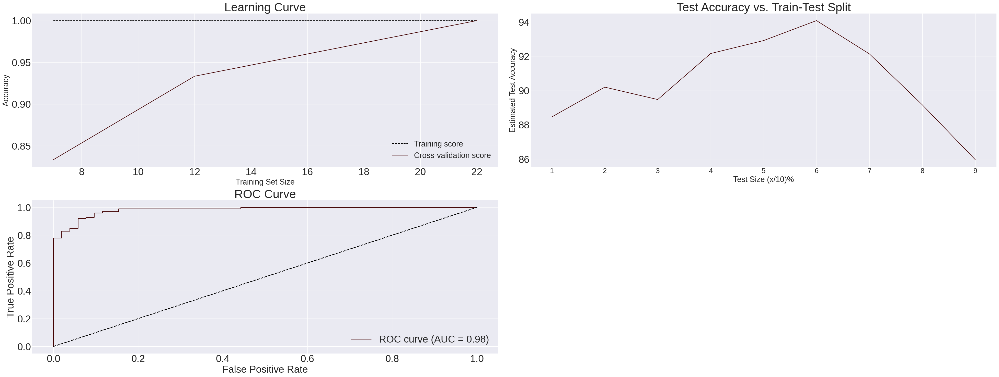



Max Accuracy: 94.07894736842105
F1:  0.9403476256362996
Jaccard: 0.8881987577639752


Params:  {'C': 0.05963623316594643, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 3 minute run time.
#Scaled
Ac_lr_scnr,F1_lr_scnr,Jac_lr_scnr=models_logreg(Xs_narrow,ys, 's')

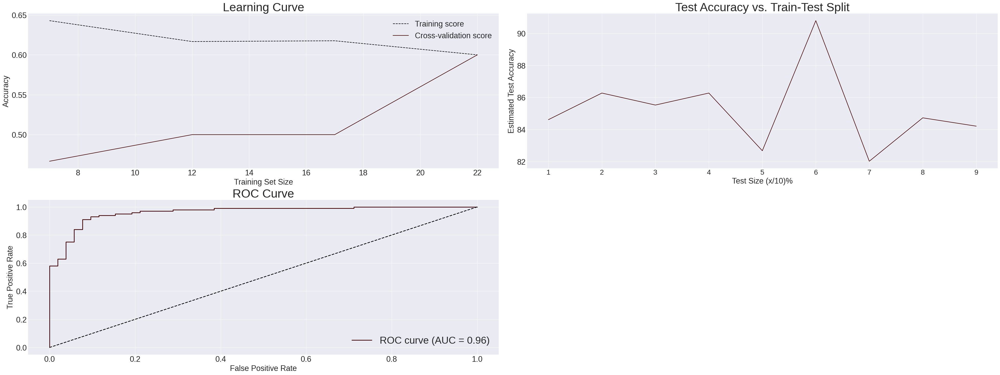



Max Accuracy: 90.78947368421053
F1:  0.9074477107153441
Jaccard: 0.8313253012048193


Params:  {'C': 2222.996482526191, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 2 minute run time.
#Normalized
Ac_lr_nnr,F1_lr_nnr,Jac_lr_nnr=models_logreg(Xs_narrow,ys, 'n')

### K Nearest Neighbors

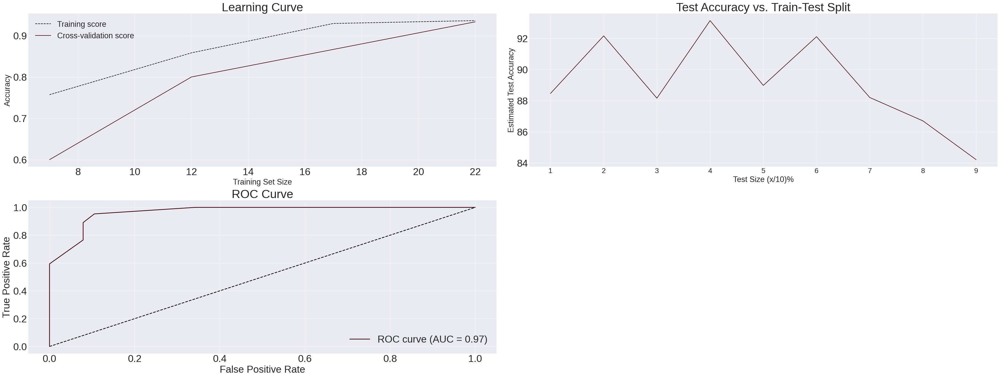



Max Accuracy: 93.13725490196079
F1:  0.9311810305517557
Jaccard: 0.8715596330275229


Params:  {'algorithm': 'auto', 'n_neighbors': 10, 'weights': 'uniform'}


In [ ]:
#<1 minute run time.
Ac_knn_n,F1_knn_n,Jac_knn_n=models_knn(Xs_narrow,ys)

### Classification Tree and Pruning

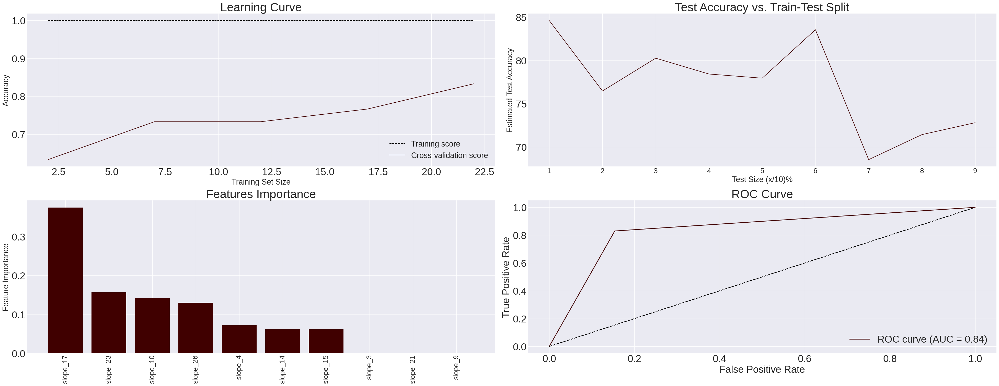



Max Accuracy: 84.61538461538461
F1:  0.8382011183265581
Jaccard: 0.7175141242937854


Params:  {'criterion': 'entropy', 'max_depth': 15, 'min_samples_split': 4}


In [ ]:
#Approximately 2 minute run time.
Ac_ctree_nr,F1_ctree_nr,Jac_ctree_nr=models_ctreep(Xs_narrow,ys)

## Reduced by Correlation

These results are not improvements upon the previous models. Several are the worst performing models evaluated.

In [ ]:
#Reduce df to top 5 and bottom 5 correlated with 'state'
#nlargest (6) is used to encapsulate the response variable
cols = df_s.corr().nlargest(6, 'state')['state'].index
col2 = df_s.corr().nsmallest(5, 'state')['state'].index
cols=cols.append(col2)
df_reduce=df_s[cols]

#Define X and y 
y_r=df_reduce['state']
X_r=df_reduce.drop(['state'], axis=1)


### Support Vector Classification

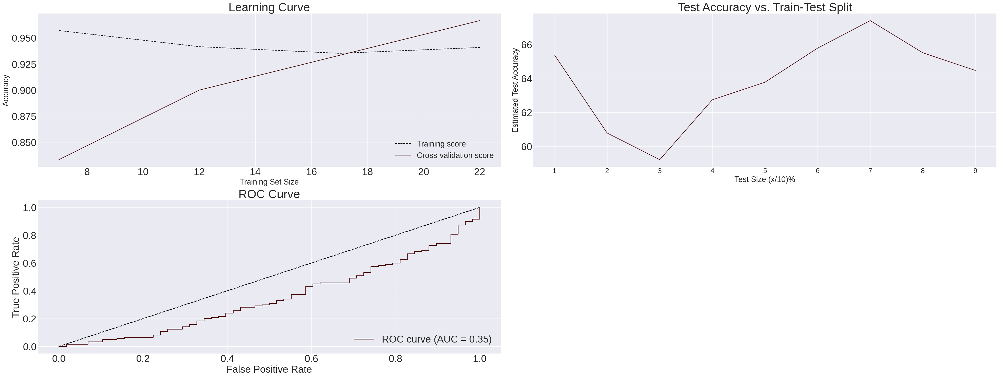



Max Accuracy: 67.41573033707866
F1:  0.5429454792247945
Jaccard: 0.5084745762711864


Params:  {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


In [ ]:
#Approximately 3 minute run time.
Ac_svc_r,F1_svc_r,Jac_svc_r=models_svc(X_r,y_r)

### Logistic Regression x3

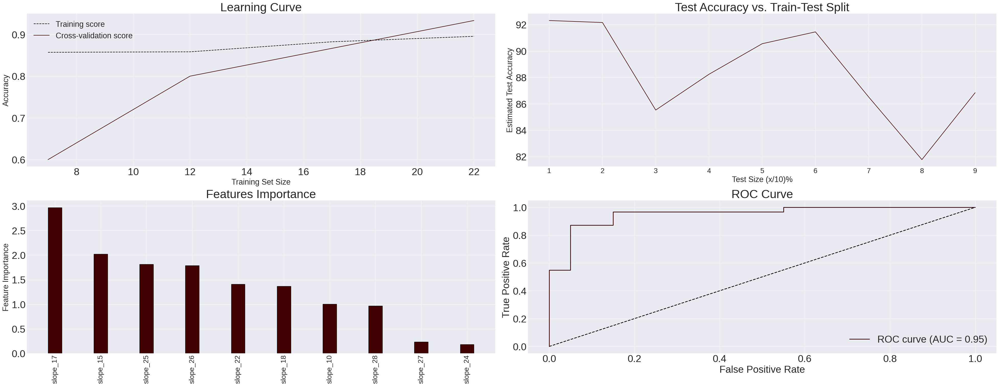



Max Accuracy: 92.3076923076923
F1:  0.9207301341589267
Jaccard: 0.8545454545454545


Params:  {'C': 3.727593720314938, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 3 minute run time.
Ac_lr_r,F1_lr_r,Jac_lr_r=models_logreg(X_r,y_r)

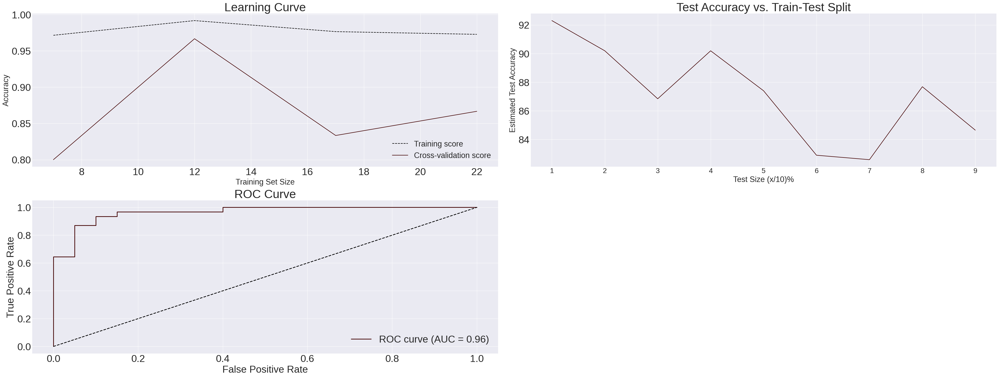



Max Accuracy: 92.3076923076923
F1:  0.9014819603054898
Jaccard: 0.8214285714285714


Params:  {'C': 0.05963623316594643, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 2 minute run time.
#Scaled
Ac_lr_scr,F1_lr_scr,Jac_lr_scr=models_logreg(X_r, y_r, 's')

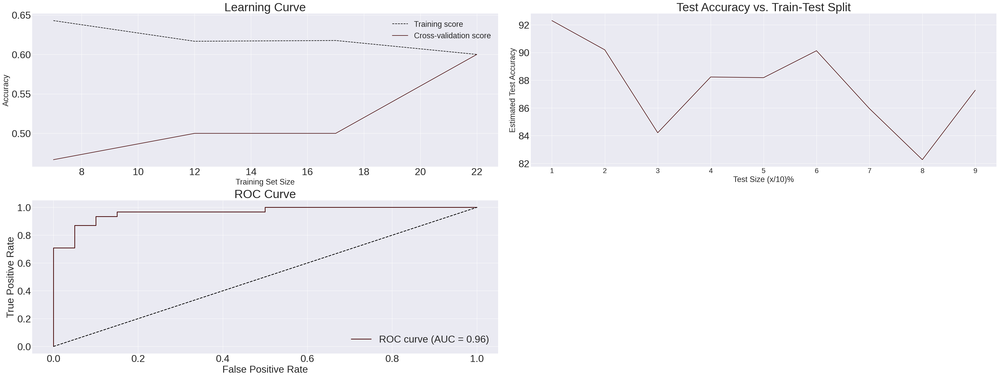



Max Accuracy: 92.3076923076923
F1:  0.9023527843764455
Jaccard: 0.8214285714285714


Params:  {'C': 232.99518105153672, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
#Approximately 2 minute run time.
#Normalized
Ac_lr_rn,F1_lr_rn,Jac_lr_rn=models_logreg(X_r,y_r, 'n')

### Random Forest

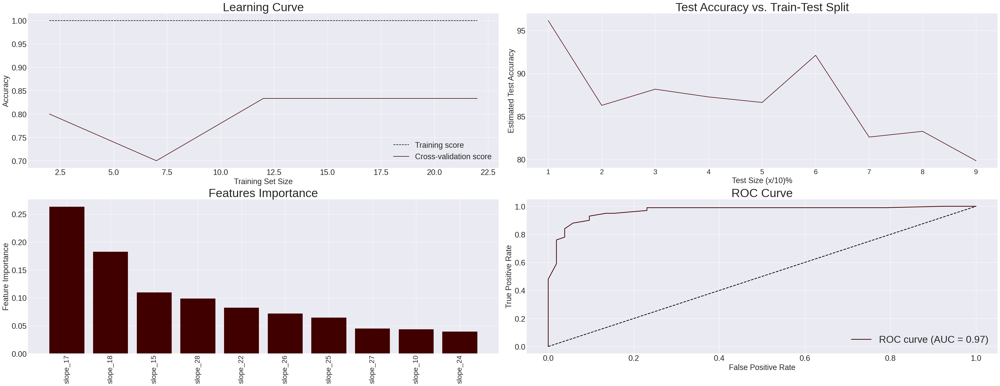



Max Accuracy: 96.15384615384616
F1:  0.9213986939905511
Jaccard: 0.8536585365853658


Params:  {'criterion': 'gini', 'max_depth': 15, 'n_estimators': 23}


In [ ]:
#Approximately 25 minute run time.
Ac_rf_r,F1_rf_r,Jac_rf_r=models_rf(X_r,y_r)

### K Nearest Neighbors

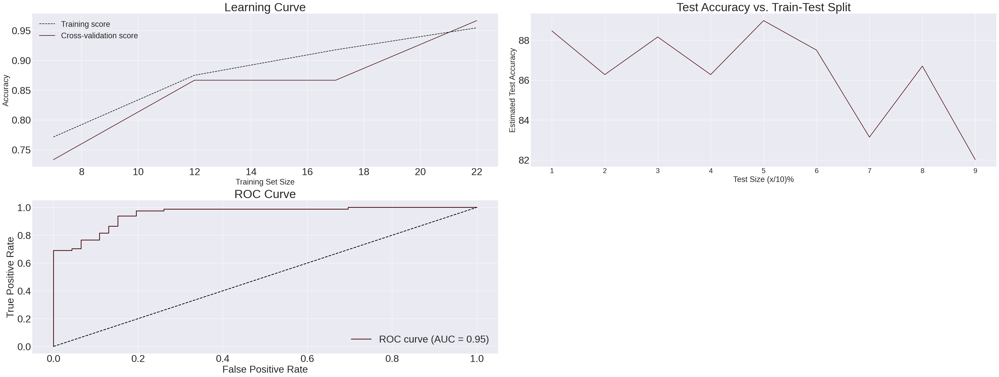



Max Accuracy: 88.9763779527559
F1:  0.889763779527559
Jaccard: 0.8014184397163121


Params:  {'algorithm': 'auto', 'n_neighbors': 24, 'weights': 'distance'}


In [ ]:
#<1 minute run time.
Ac_knn_r,F1_knn_r,Jac_knn_r=models_knn(X_r, y_r)

### Classification Tree and Pruning

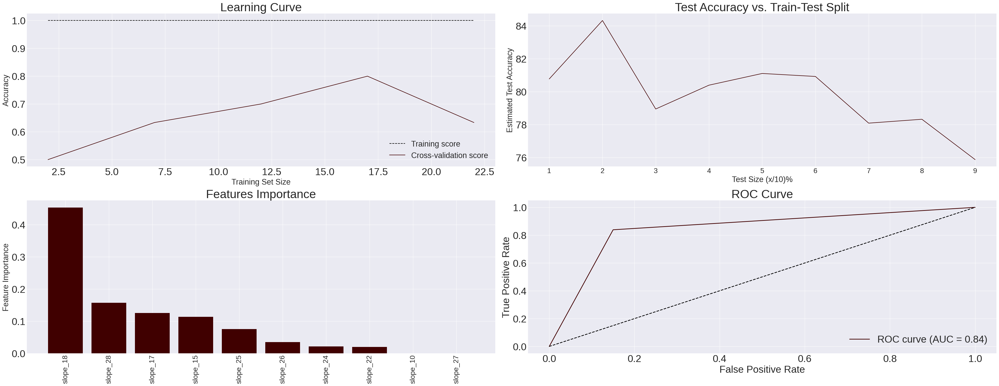



Max Accuracy: 84.31372549019608
F1:  0.8442577030812324
Jaccard: 0.7288135593220338


Params:  {'criterion': 'gini', 'max_depth': 11, 'min_samples_split': 2}


In [ ]:
#Approximately 2 minute run time.
Ac_ctree_r,F1_ctree_r,Jac_ctree_r=models_ctreep(X_r,y_r)

# Analysis

## Base Models

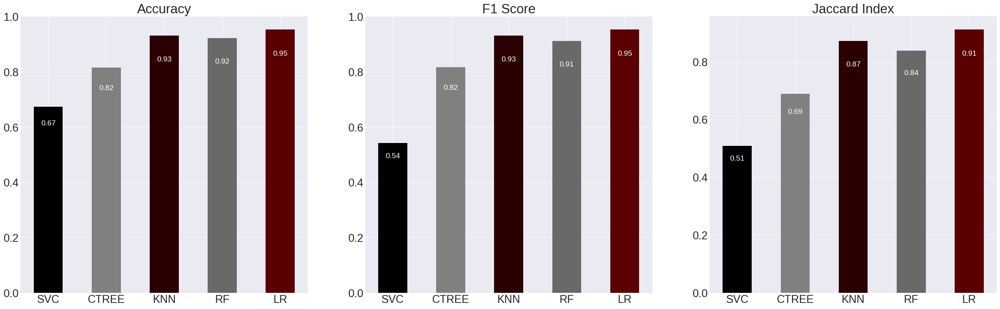

In [ ]:
#Base Models only
df_ac = [Ac_svc/100, Ac_ctree/100, Ac_knn/100, Ac_rf/100, Ac_lr/100]
df_f1 = [F1_svc, F1_ctree, F1_knn, F1_rf, F1_lr]
df_j = [Jac_svc, Jac_ctree, Jac_knn, Jac_rf, Jac_lr]

# set up the figure and axis objects
fig, ax = plt.subplots(1, 3, figsize=(35, 10))

# set font size
plt.rcParams['font.size'] = 22

# set colors for the bars
colors = ['#000000', '#808080', '#2a0000', '#696969', '#5a0000']

# plot the bars for each list on their corresponding axis object
ax[0].bar(['SVC', 'CTREE', 'KNN', 'RF', 'LR'], df_ac, color=colors, width=.5)
ax[1].bar(['SVC', 'CTREE', 'KNN', 'RF', 'LR'], df_f1, color=colors, width=.5)
ax[2].bar(['SVC', 'CTREE', 'KNN', 'RF', 'LR'], df_j, color=colors, width=.5)

# set x-axis labels for each axis object
ax[0].set_xticklabels(['SVC', 'CTREE', 'KNN', 'RF', 'LR'], rotation=0)
ax[1].set_xticklabels(['SVC', 'CTREE', 'KNN', 'RF', 'LR'], rotation=0)
ax[2].set_xticklabels(['SVC', 'CTREE', 'KNN', 'RF', 'LR'], rotation=0)

# set titles for each axis object
ax[0].set_title('Accuracy')
ax[1].set_title('F1 Score')
ax[2].set_title('Jaccard Index')


# add labels to each bar
for i in range(3):
    for patch in ax[i].patches:
        height = patch.get_height()
        ax[i].text(patch.get_x() + patch.get_width() / 2, height - 0.1 * height, "{:.2f}".format(height), ha='center', color='white', fontsize=15)

# display the plot
plt.show()

## Narrow Models (Random Forest Selection)

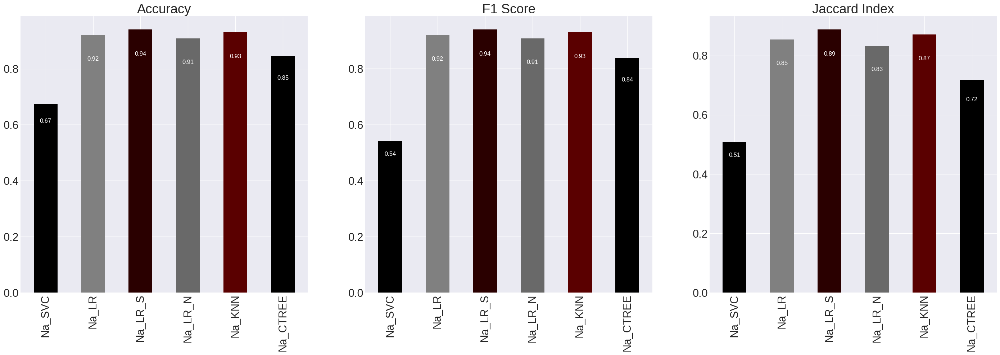

In [ ]:
#Narrow Models only

df_acn = [Ac_svc_nr/100,Ac_lr_nr/100,Ac_lr_scnr/100, Ac_lr_nnr/100, Ac_knn_n/100,Ac_ctree_nr/100]
df_f1n = [F1_svc_nr, F1_lr_nr, F1_lr_scnr,F1_lr_nnr,F1_knn_n,F1_ctree_nr]
df_jn = [Jac_svc_nr,Jac_lr_nr, Jac_lr_scnr,Jac_lr_nnr,Jac_knn_n,Jac_ctree_nr]

# set up the figure and axis objects
fig, ax = plt.subplots(1, 3, figsize=(35, 10))

# set font size
plt.rcParams['font.size'] = 22

# set colors for the bars
colors = ['#000000', '#808080', '#2a0000', '#696969', '#5a0000','#000000']

# plot the bars for each list on their corresponding axis object
ax[0].bar(['Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE'], df_acn, color=colors, width=.5)
ax[1].bar(['Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE'], df_f1n, color=colors, width=.5)
ax[2].bar(['Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE'], df_jn, color=colors, width=.5)

# set x-axis labels for each axis object
ax[0].set_xticklabels(['Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE'], rotation=90)
ax[1].set_xticklabels(['Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE'], rotation=90)
ax[2].set_xticklabels(['Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE'], rotation=90)

# set titles for each axis object
ax[0].set_title('Accuracy')
ax[1].set_title('F1 Score')
ax[2].set_title('Jaccard Index')


# add labels to each bar
for i in range(3):
    for patch in ax[i].patches:
        height = patch.get_height()
        ax[i].text(patch.get_x() + patch.get_width() / 2, height - 0.1 * height, "{:.2f}".format(height), ha='center', color='white', fontsize=12)

# display the plot
plt.show()

## Reduced Models (Correlation Selection)

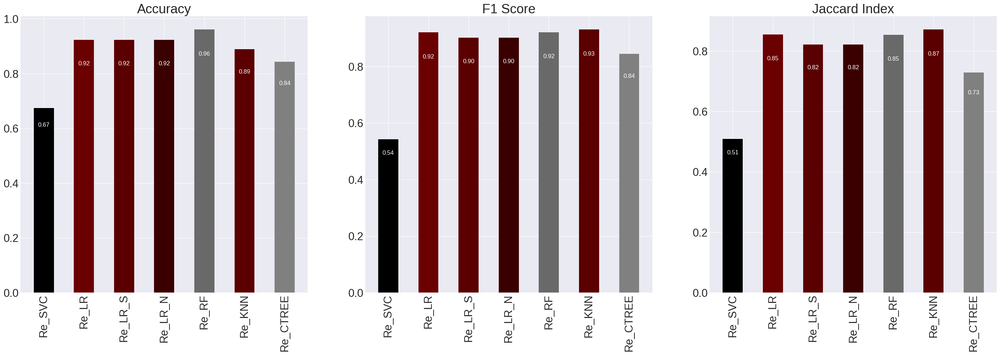

In [ ]:
#Reduced Models only

df_acr = [Ac_svc_r/100,Ac_lr_r/100,Ac_lr_scr/100, Ac_lr_rn/100, Ac_rf_r/100, Ac_knn_r/100,Ac_ctree_r/100]
df_f1r = [F1_svc_r, F1_lr_r, F1_lr_scr,F1_lr_rn,F1_rf_r,F1_knn_n,F1_ctree_r]
df_jr = [Jac_svc_r,Jac_lr_r, Jac_lr_scr,Jac_lr_rn,Jac_rf_r,Jac_knn_n,Jac_ctree_r]

# set up the figure and axis objects
fig, ax = plt.subplots(1, 3, figsize=(35, 10))

# set font size
plt.rcParams['font.size'] = 22

# set colors for the bars
colors = ['#000000',  '#6a0000','#5a0000', '#3a0000', '#696969', '#5a0000','#808080']

# plot the bars for each list on their corresponding axis object
ax[0].bar(['Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], df_acr, color=colors, width=.5)
ax[1].bar(['Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], df_f1r, color=colors, width=.5)
ax[2].bar(['Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], df_jr, color=colors, width=.5)

# set x-axis labels for each axis object
ax[0].set_xticklabels(['Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], rotation=90)
ax[1].set_xticklabels(['Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], rotation=90)
ax[2].set_xticklabels(['Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], rotation=90)

# set titles for each axis object
ax[0].set_title('Accuracy')
ax[1].set_title('F1 Score')
ax[2].set_title('Jaccard Index')


# add labels to each bar
for i in range(3):
    for patch in ax[i].patches:
        height = patch.get_height()
        ax[i].text(patch.get_x() + patch.get_width() / 2, height - 0.1 * height, "{:.2f}".format(height), ha='center', color='white', fontsize=12)

# display the plot
plt.show()

## All Models

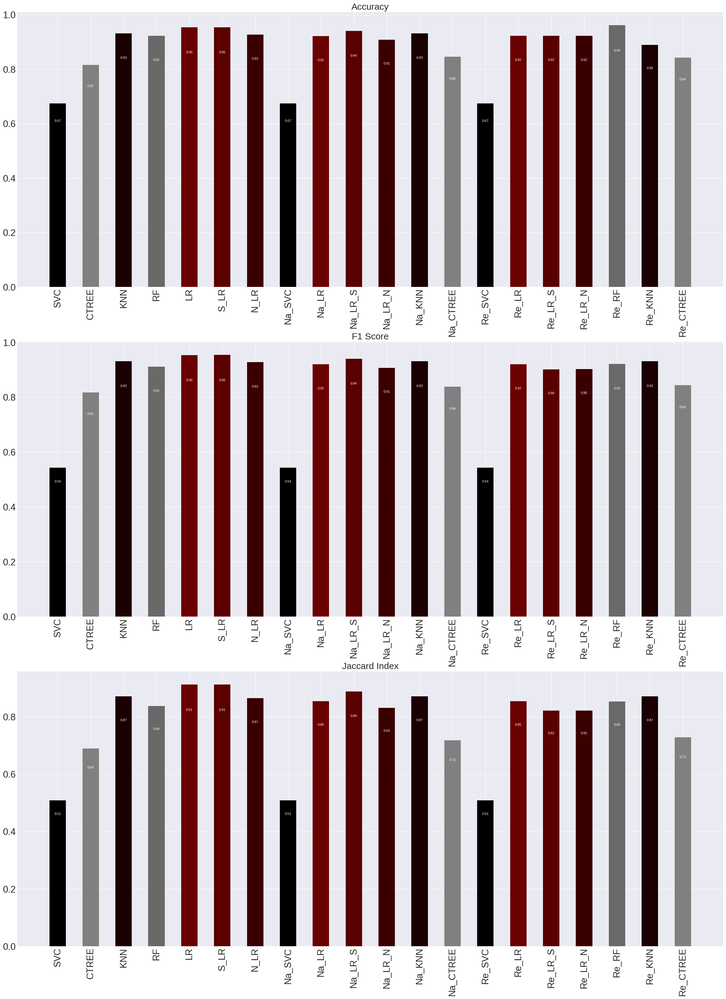

In [ ]:
#All Models

df_aca = [Ac_svc/100, Ac_ctree/100, Ac_knn/100, Ac_rf/100, Ac_lr/100,Ac_lr_sc/100,Ac_lr_n/100,Ac_svc_nr/100,Ac_lr_nr/100,Ac_lr_scnr/100, Ac_lr_nnr/100, Ac_knn_n/100,Ac_ctree_nr/100,
          Ac_svc_r/100,Ac_lr_r/100,Ac_lr_scr/100, Ac_lr_rn/100, Ac_rf_r/100, Ac_knn_r/100,Ac_ctree_r/100]
df_f1a = [F1_svc, F1_ctree, F1_knn, F1_rf, F1_lr,F1_lr_sc, F1_lr_n,F1_svc_nr, F1_lr_nr, F1_lr_scnr,F1_lr_nnr,F1_knn_n,F1_ctree_nr,
          F1_svc_r, F1_lr_r, F1_lr_scr,F1_lr_rn,F1_rf_r,F1_knn_n,F1_ctree_r]
df_ja = [Jac_svc, Jac_ctree, Jac_knn, Jac_rf, Jac_lr,Jac_lr_sc, Jac_lr_n, Jac_svc_nr,Jac_lr_nr, Jac_lr_scnr,Jac_lr_nnr,Jac_knn_n,Jac_ctree_nr,
         Jac_svc_r,Jac_lr_r, Jac_lr_scr,Jac_lr_rn,Jac_rf_r,Jac_knn_n,Jac_ctree_r]

# set up the figure and axis objects
fig, ax = plt.subplots(3, 1, figsize=(30, 40))

# set font size
plt.rcParams['font.size'] = 18

# set colors for the bars

colors = ['#000000', '#808080', '#1a0000', '#696969', '#6a0000','#5a0000', '#3a0000', '#000000',  '#6a0000','#5a0000', '#3a0000','#1a0000', '#808080', '#000000', '#6a0000','#5a0000', '#3a0000','#696969','#1a0000', '#808080']

# plot the bars for each list on their corresponding axis object
ax[0].bar(['SVC', 'CTREE', 'KNN', 'RF', 'LR','S_LR','N_LR','Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE','Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], df_aca, color=colors, width=.5)
ax[1].bar(['SVC', 'CTREE', 'KNN', 'RF', 'LR','S_LR','N_LR','Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE','Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], df_f1a, color=colors, width=.5)
ax[2].bar(['SVC', 'CTREE', 'KNN', 'RF', 'LR','S_LR','N_LR','Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE','Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], df_ja, color=colors, width=.5)

# set x-axis labels for each axis object
ax[0].set_xticklabels(['SVC', 'CTREE', 'KNN', 'RF', 'LR','S_LR','N_LR','Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE','Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], rotation=90)
ax[1].set_xticklabels(['SVC', 'CTREE', 'KNN', 'RF', 'LR','S_LR','N_LR','Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE','Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], rotation=90)
ax[2].set_xticklabels(['SVC', 'CTREE', 'KNN', 'RF', 'LR','S_LR','N_LR','Na_SVC','Na_LR','Na_LR_S','Na_LR_N','Na_KNN','Na_CTREE','Re_SVC','Re_LR','Re_LR_S','Re_LR_N','Re_RF','Re_KNN','Re_CTREE'], rotation=90)

# set titles for each axis object
ax[0].set_title('Accuracy')
ax[1].set_title('F1 Score')
ax[2].set_title('Jaccard Index')


# add labels to each bar
for i in range(3):
    for patch in ax[i].patches:
        height = patch.get_height()
        ax[i].text(patch.get_x() + patch.get_width() / 2, height - 0.1 * height, "{:.2f}".format(height), ha='center', color='white', fontsize=8)

# display the plot
plt.show()

Logistic Regression Models consistently rank higher in each metric